In [1]:
import numpy as np
import scipy as sc
import cv2
import time
import matplotlib.pyplot as plt
from keras.applications.vgg16 import VGG16

from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.vgg16 import preprocess_input
from keras.layers import Input, Flatten, Dense, Dropout
from keras.models import Model, load_model

from keras.optimizers import SGD

from keras.callbacks import ModelCheckpoint
from keras.utils.vis_utils import plot_model


c:\users\hiro\anaconda3\envs\tensorflow\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


### Either create new model using vgg features OR load existing

In [45]:
'''Creates new model my_model'''
# #https://github.com/keras-team/keras/issues/4465

#Get back the convolutional part of a VGG network trained on ImageNet
model_vgg16_conv = VGG16(weights='imagenet', include_top=False)
# model_vgg16_conv.summary()

#Input
input = Input(shape = (150,150,3), name = 'image_input')

#Freeze vgg layers
model_vgg16_conv.trainable = False

#Use the generated model 
output_vgg16_conv = model_vgg16_conv(input)

#Add the fully-connected layers 
x = Flatten(name='flatten')(output_vgg16_conv)
# x = Dense(4096, activation='relu', name='fc1')(x)
# x = Dropout(.5)(x)
# x = Dense(64, activation='softmax', name='fc2')(x)
x = Dense(2, activation='softmax', name='predictions')(x)

#Create your own model 
my_model = Model(input=input, output=x)

#In the summary, weights and layers from VGG part will be hidden, but they will be fit during the training
# my_model.summary()

c:\users\hiro\anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:25: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("im..., outputs=Tensor("pr...)`


In [33]:
'''Loads existing model into my_model'''
my_model = load_model("models/new_brian_data_with_color_augmentation.hdf5")  

c:\users\hiro\anaconda3\envs\tensorflow\lib\site-packages\keras\models.py:291: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


### Setting Data generating parameters and Checkpoints for training

In [42]:
'''Helper functions'''
# https://stackoverflow.com/questions/11884544/setting-color-temperature-for-a-given-image-like-in-photoshop
kelvin_table = {
    4000: (255,209,163),
    4500: (255,219,186),
    5000: (255,228,206),
    5500: (255,236,224),
    6000: (255,243,239),
    6500: (255,249,253),
    7000: (245,243,255),
    7500: (235,238,255),
    8000: (227,233,255),
    8500: (220,229,255),
    9000: (214,225,255),
    9500: (208,222,255),
    10000: (204,219,255)}

def convert_temp(x, temp):
    color_scale = np.array(kelvin_table[temp]) / 255
    return (x * color_scale).astype(np.uint8)

#https://www.pyimagesearch.com/2015/10/05/opencv-gamma-correction/
def adjust_gamma(image, gamma=1.0):
    # build a lookup table mapping the pixel values [0, 255] to
    # their adjusted gamma values
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255
        for i in np.arange(0, 256)]).astype("uint8")

    # apply gamma correction using the lookup table
    return cv2.LUT(image, table)

def data_augmentation_function(x):
    '''takes image x and randomly applies custom data augmentation'''
    Probability_of_augmentation = .6
    randomly_true = lambda x : np.random.rand() < x
    x = np.array(x)
    if randomly_true (Probability_of_augmentation):
        '''gaussian blur with random kernel size'''
        kernel_size = 2 * np.random.randint(5) + 1
        x = cv2.GaussianBlur(x, (kernel_size,kernel_size),0)
    if randomly_true (Probability_of_augmentation):
        gamma = np.random.uniform(.5, 3)
        x = adjust_gamma(x, gamma)

    if randomly_true (Probability_of_augmentation):
        '''shuffle color channels'''
        color_channels = [0,1,2]
        np.random.shuffle(color_channels)
        x = x[:,:,color_channels]
    if randomly_true (Probability_of_augmentation):
        '''change color temperature'''
        temp = np.random.choice(list(kelvin_table.keys()))
        x = convert_temp(x, temp)
    return image.array_to_img(x)

In [46]:
# https://keras.io/preprocessing/image/
train_datagen = ImageDataGenerator(
    rotation_range = 10,
    horizontal_flip=True,
    preprocessing_function = data_augmentation_function
    )

test_datagen = ImageDataGenerator()

train_generator = train_datagen.flow_from_directory(
        'real_data/training/',
        target_size=(150, 150),
        batch_size=32,
        follow_links=True,
        class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
        'real_data/validation/',
        target_size=(150, 150),
        batch_size=32,
        follow_links=True,
        class_mode='categorical')

checkpointer = ModelCheckpoint(
    "models/new_brian_data_with_color_augmentation.hdf5", #file to save model into
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    save_weights_only=False,
    mode='auto',
    period=1)

my_model.compile(loss='binary_crossentropy',
              optimizer='Adagrad',
              metrics=['accuracy'])

Found 2864 images belonging to 2 classes.
Found 3242 images belonging to 2 classes.


In [49]:
'''Train'''
my_model.fit_generator(
        train_generator,
        steps_per_epoch=100,
        epochs=2,
        validation_data=validation_generator,
        callbacks=[checkpointer])

Epoch 1/2
 99/100 [============================>.] - ETA: 0s - loss: 0.1413 - acc: 0.9823

c:\users\hiro\anaconda3\envs\tensorflow\lib\site-packages\PIL\TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 11796480 bytes but only got 0. Skipping tag 0
  " Skipping tag %s" % (size, len(data), tag))
c:\users\hiro\anaconda3\envs\tensorflow\lib\site-packages\PIL\TiffImagePlugin.py:742: UserWarning: Corrupt EXIF data.  Expecting to read 12 bytes but only got 6. 
  warnings.warn(str(msg))
c:\users\hiro\anaconda3\envs\tensorflow\lib\site-packages\PIL\TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 80000 bytes but only got 0. Skipping tag 64640
  " Skipping tag %s" % (size, len(data), tag))
c:\users\hiro\anaconda3\envs\tensorflow\lib\site-packages\PIL\TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 26214400 bytes but only got 0. Skipping tag 0
  " Skipping tag %s" % (size, len(data), tag))
c:\users\hiro\anaconda3\envs\tensorflow\lib\site-packages\PIL\TiffImagePlugin.py:725: UserWar

100/100 [==============================] - 52s 515ms/step - loss: 0.1399 - acc: 0.9825 - val_loss: 0.3948 - val_acc: 0.9645

Epoch 00001: val_loss did not improve
Epoch 2/2
100/100 [==============================] - 44s 438ms/step - loss: 0.1235 - acc: 0.9875 - val_loss: 0.3020 - val_acc: 0.9719

Epoch 00002: val_loss did not improve


### Evaluating Model accuracy

In [50]:
'''Select model to evaluate'''
my_model = load_model("models/new_brian_data_with_color_augmentation.hdf5")

c:\users\hiro\anaconda3\envs\tensorflow\lib\site-packages\keras\models.py:291: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


In [51]:
'''Load images'''
from PIL import Image
import glob

'''List directories in glob form for each class'''
drone_files_list = [
                        'real_data/drone/drone_advertisements/*',
                        'real_data/drone/drone_dataset_square/*',
                        'real_data/drone/drone_in_grass/*',
                        'real_data/drone/drone_in_office/*',
                        'real_data/drone/drone_office/*',
                   ]
not_drone_files_list = [
                        'real_data/not_drone/not_drone_office_env1/*',
                        'real_data/not_drone/not_drone_office_env2/*',
                        'real_data/not_drone/not_drone_rc_airplanes/*',
                        'real_data/not_drone/not_drone_trees/*',
                       ]

drone_images = []
drone_filenames = []
for drone_files in drone_files_list:
    for filename in glob.glob(drone_files):
        im=Image.open(filename)
        drone_images.append(im)
        drone_filenames.append(filename)

not_drone_images = []
not_drone_filenames = []
for not_drone_files in not_drone_files_list:
    for filename in glob.glob(not_drone_files):
        im=Image.open(filename)
        not_drone_images.append(im)
        drone_filenames.append(filename)

y_label = np.r_[np.zeros(len(drone_images)), np.ones(len(not_drone_images))]
x_data = [np.array(im) for im in (drone_images + not_drone_images)]
data_filenames = drone_filenames + not_drone_filenames

c:\users\hiro\anaconda3\envs\tensorflow\lib\site-packages\PIL\TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 11796480 bytes but only got 0. Skipping tag 0
  " Skipping tag %s" % (size, len(data), tag))
c:\users\hiro\anaconda3\envs\tensorflow\lib\site-packages\PIL\TiffImagePlugin.py:742: UserWarning: Corrupt EXIF data.  Expecting to read 12 bytes but only got 6. 
  warnings.warn(str(msg))
c:\users\hiro\anaconda3\envs\tensorflow\lib\site-packages\PIL\TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 30000 bytes but only got 29986. Skipping tag 37500
  " Skipping tag %s" % (size, len(data), tag))
c:\users\hiro\anaconda3\envs\tensorflow\lib\site-packages\PIL\TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 80000 bytes but only got 0. Skipping tag 64640
  " Skipping tag %s" % (size, len(data), tag))
c:\users\hiro\anaconda3\envs\tensorflow\lib\site-packages\PIL\TiffImagePlugin.py:725: Us

MemoryError: 

real_data/drone/drone_advertisements\70. $_57.jpg
label:
 0.0


c:\users\hiro\anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:5: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
  """


prediction (one hot encoded): 
 [[1. 0.]]


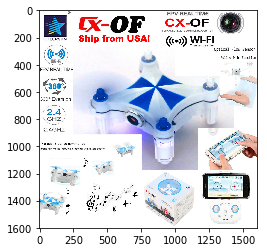

In [52]:
'''Display one element in the loaded array'''
num = 226
print(data_filenames[num])
print("label:\n", y_label[num])
print("prediction (one hot encoded): \n", my_model.predict(np.expand_dims(sc.misc.imresize(x_data[num],(150,150)), axis = 0)))
plt.imshow(x_data[num])
plt.show()

In [53]:
'''evaluate score for all loaded images'''
# loss_list evaluates loss function, accuracy_list is 1 if classified correctly else 0, confidence is the probability the image falls into each class.
loss_list = []
accuracy_list = []
confidence_list = []
x_eval =  [np.expand_dims(sc.misc.imresize(im,(150,150)), axis = 0) for im in x_data]
y_eval = np.zeros((len(y_label),1, 2))
y_eval[np.arange(len(y_label)),np.zeros(len(y_label)).astype(int),y_label.astype(int)] = 1
start = time.time()
for num in range(len(y_label)):
    # hack to ignore grayscale, tossing values makes length inconsistent with y_label etc.
    try:
        loss, acc = my_model.evaluate(x_eval[num], y_eval[num], verbose = False)
        confidence = my_model.predict(x_eval[num])
    except:
        continue
    loss_list.append(loss)
    accuracy_list.append(int(np.around(acc)))
    confidence_list.append(confidence)
end = time.time()
confidence_list = np.array(confidence_list)
print(sum(loss_list))
print(np.mean(accuracy_list))

c:\users\hiro\anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
  


1318.8991399592883
0.9809464313602999


In [54]:
print(end-start)
print(len(confidence_list))
print("average num images per second:", len(confidence_list) / (end-start))

105.83023047447205
6403
average num images per second: 60.502561236928486


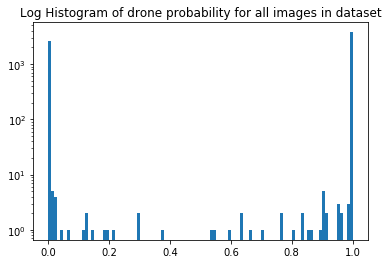

In [72]:
plt.title("Log Histogram of drone probability for all images in dataset")
plt.hist(confidence_list[:,0,0], bins = 100, log = True)
plt.show()

In [ ]:
'''get accuracy from threshold'''
thresh_accuracy_list = []
required_drone_confidence_thresh = 0.5
for i in range(len(y_label)):
    is_drone = confidence_list[i,0,0] > required_drone_confidence_thresh
    is_actually_drone = 1 - y_label[i]
    is_correct = is_drone == is_actually_drone
    thresh_accuracy_list.append(is_correct)
    '''prints index where there is a difference compared to baseline accuracy_list (which is 0.5 threshold)'''
    if accuracy_list[i] != is_correct:
        print(i)

Should be drone


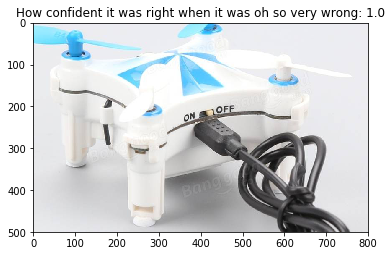

Should be drone


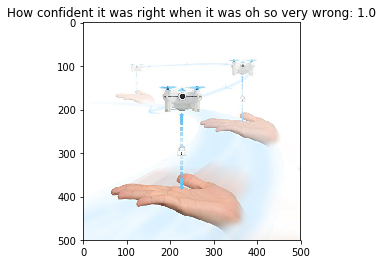

Should be drone


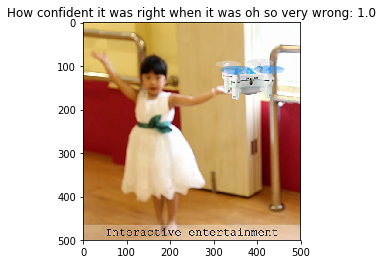

Should be drone


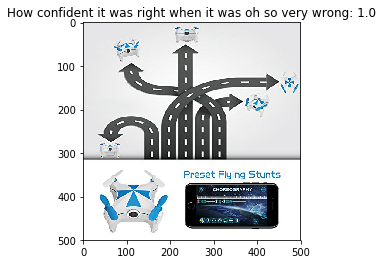

Should be drone


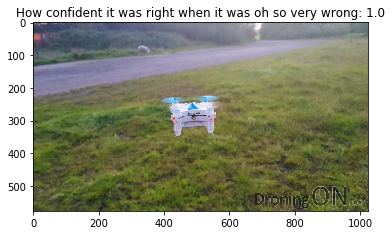

Should be drone


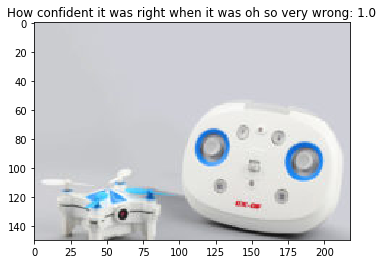

Should be drone


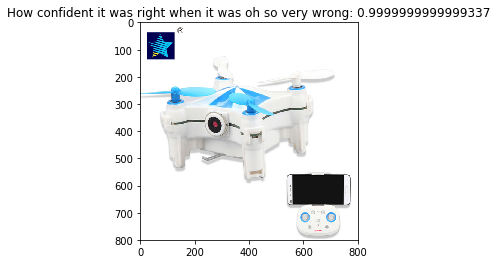

Should be drone


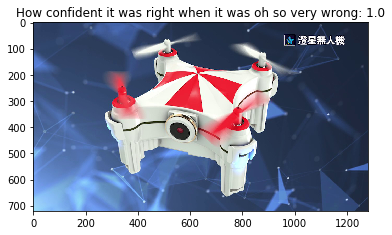

Should be drone


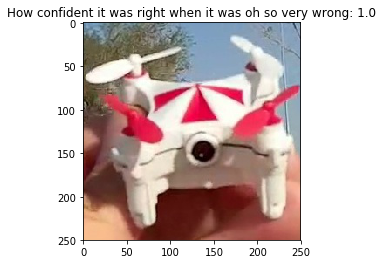

Should be drone


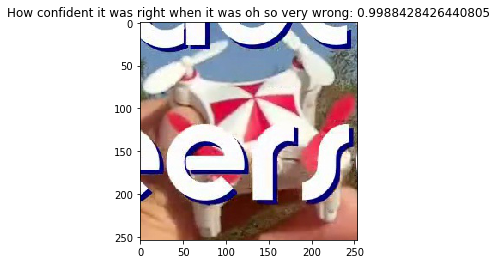

Should be drone


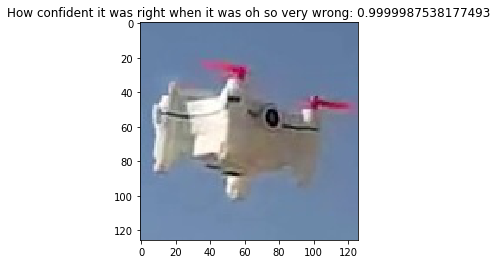

Should be drone


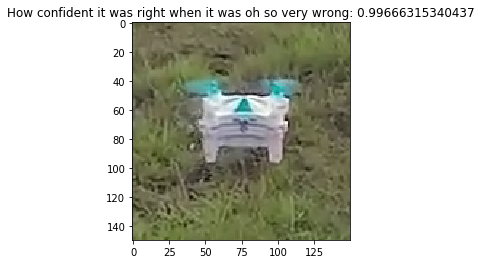

Should be drone


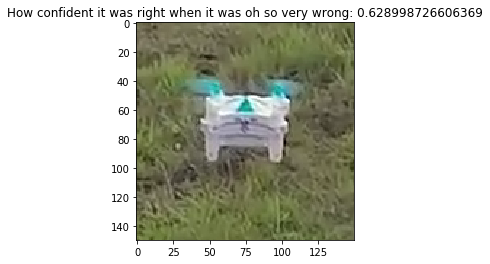

Should be drone


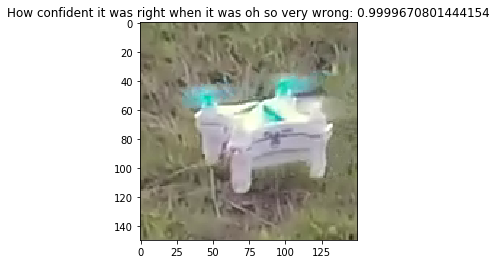

Should be drone


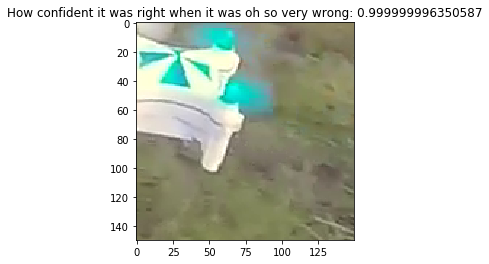

Should be drone


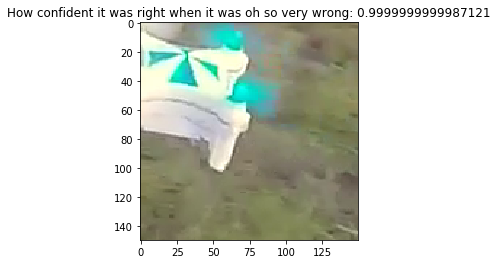

Should be drone


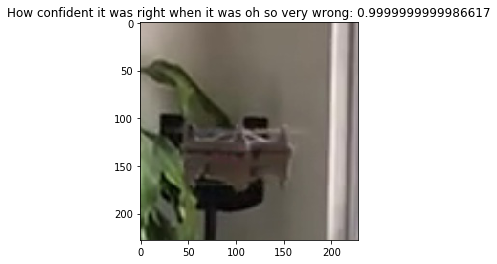

Should be drone


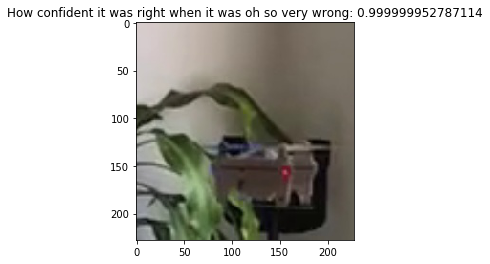

Should be drone


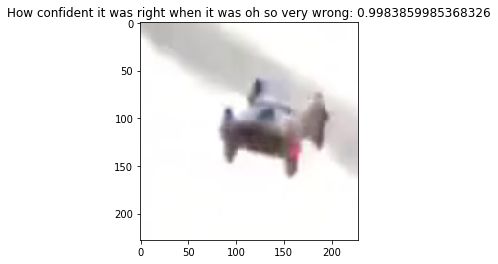

Should be drone


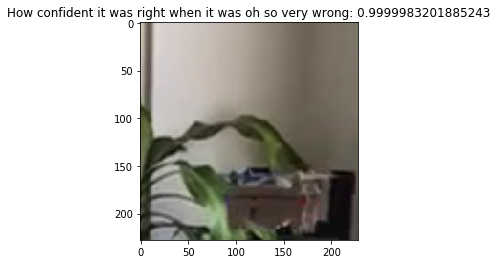

Should be drone


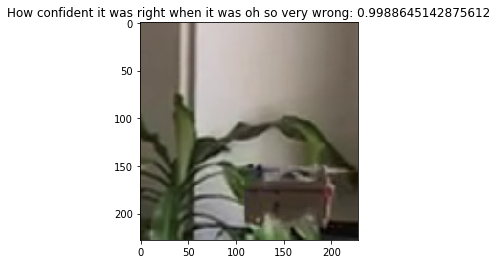

Should be drone


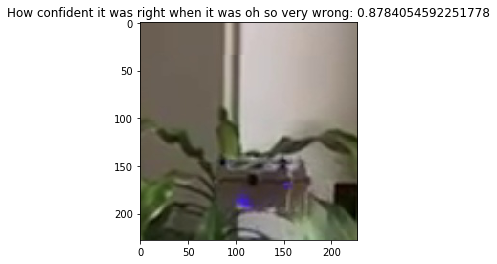

Should be drone


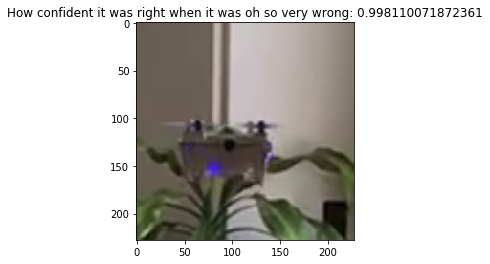

Should be drone


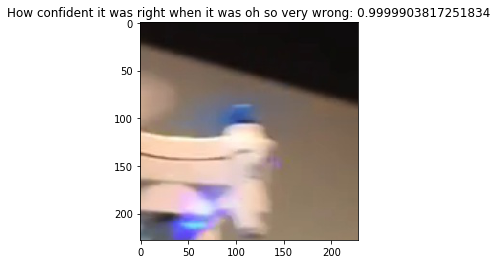

Should be drone


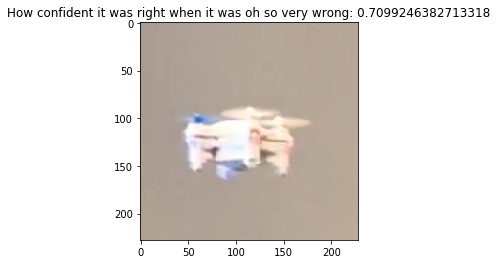

Should be drone


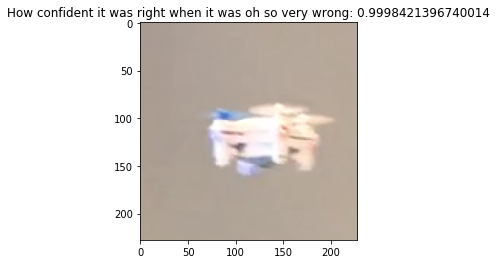

Should be drone


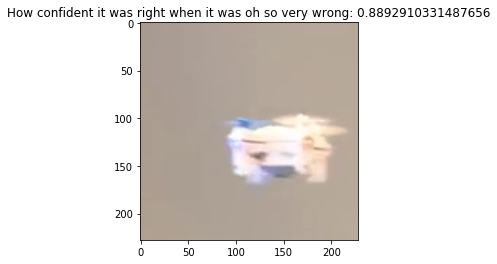

Should be drone


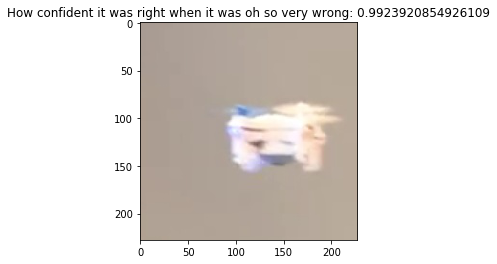

Should be drone


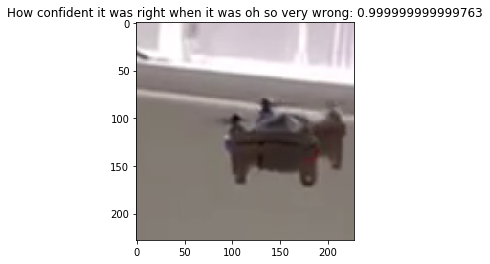

Should be drone


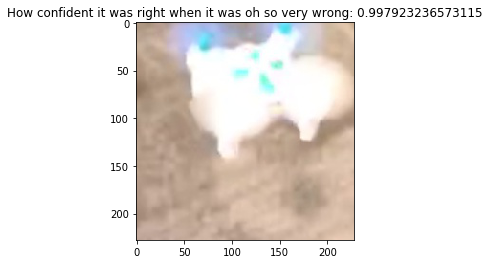

Should be drone


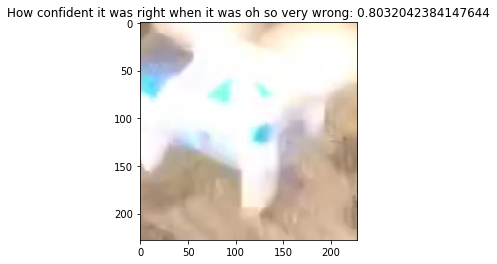

Should be drone


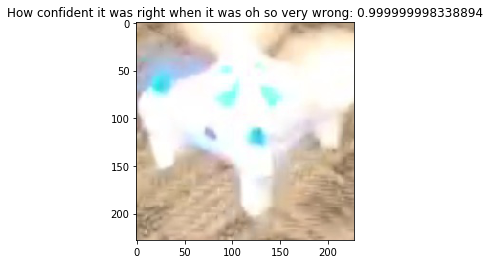

Should be drone


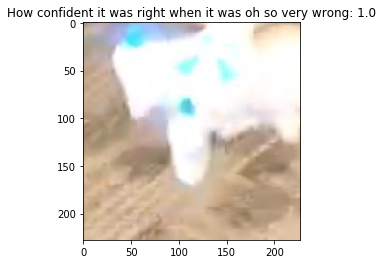

Should be drone


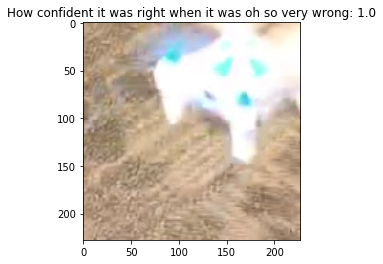

Should be drone


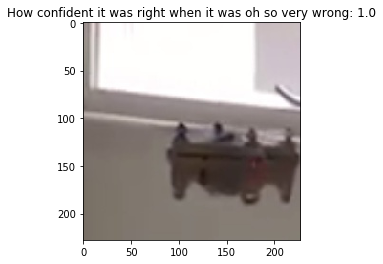

Should be drone


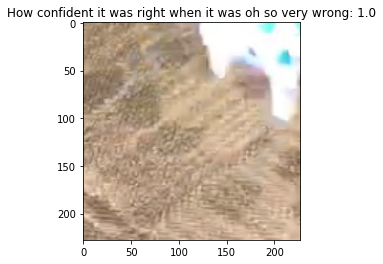

Should be drone


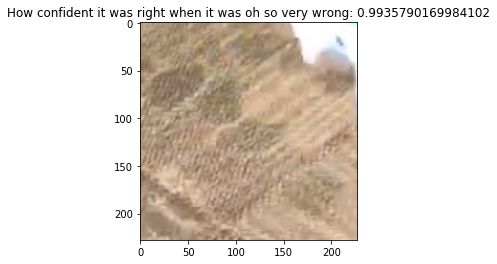

Should be drone


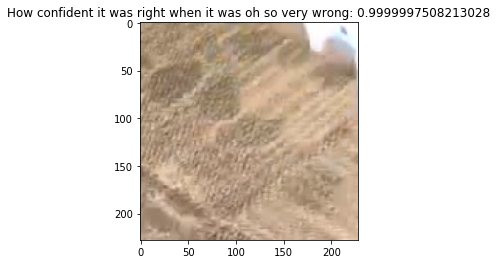

Should be drone


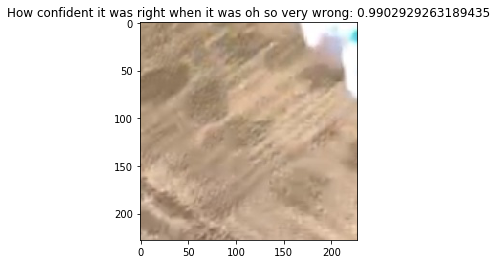

Should be drone


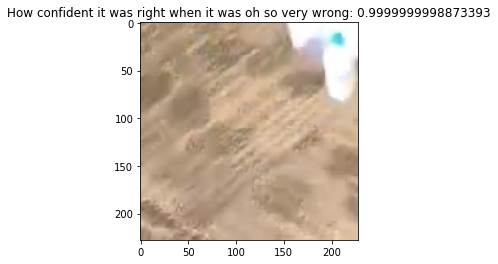

Should be drone


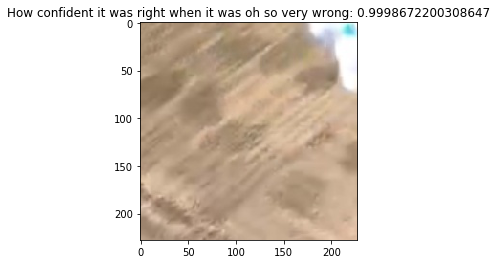

Should be drone


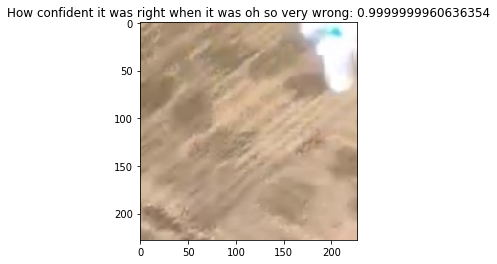

Should be drone


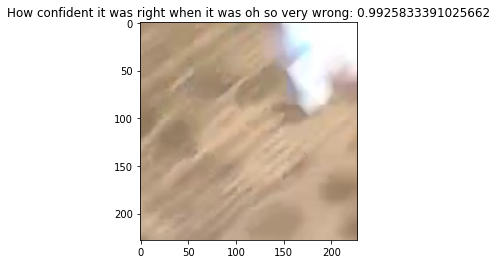

Should be drone


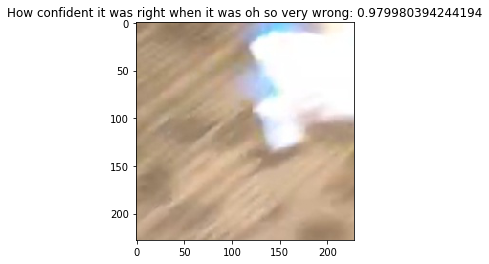

Should be drone


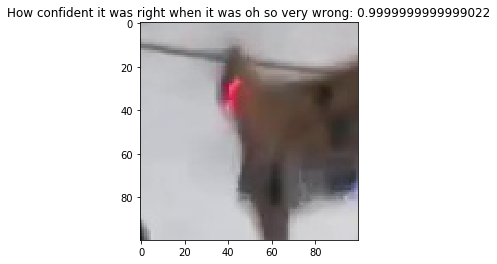

Should be drone


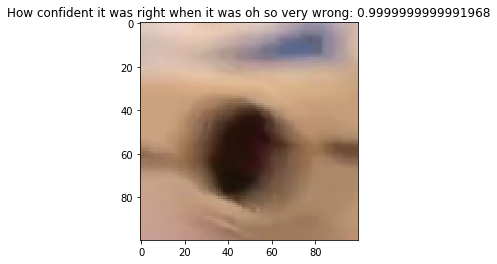

Should be drone


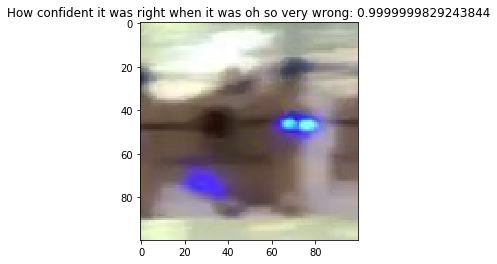

Should be drone


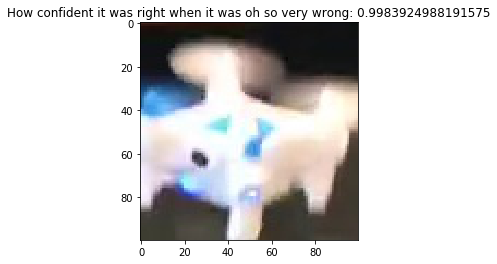

Should be drone


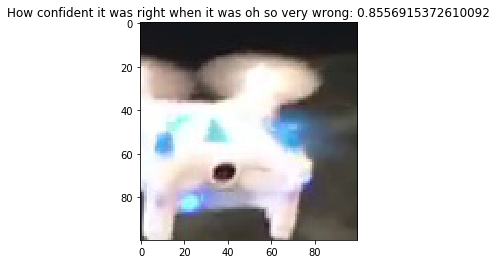

Should be not_drone


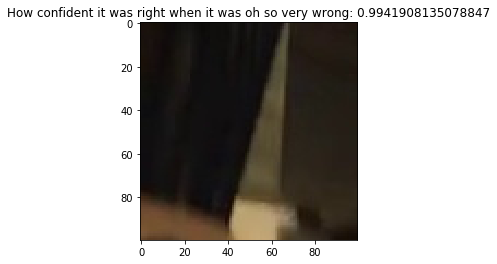

Should be not_drone


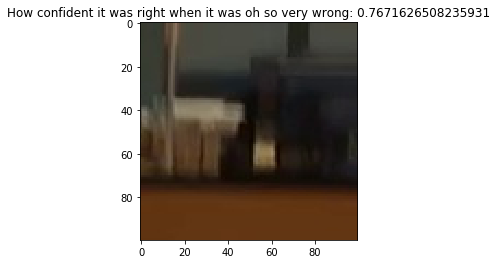

Should be not_drone


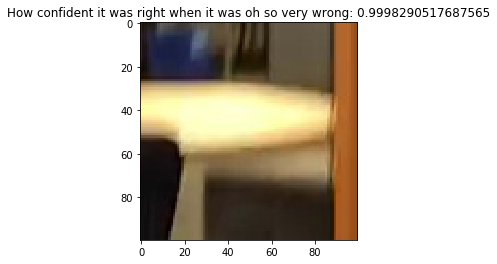

Should be not_drone


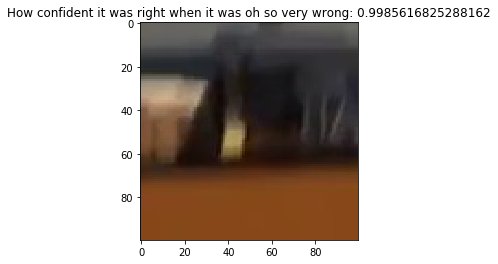

Should be not_drone


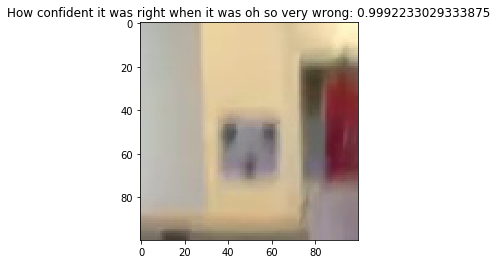

Should be not_drone


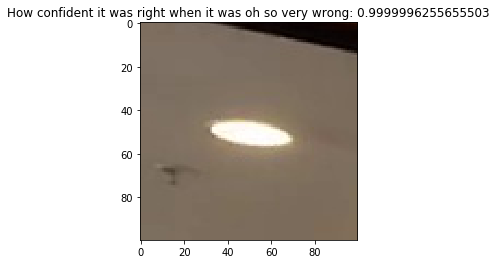

Should be not_drone


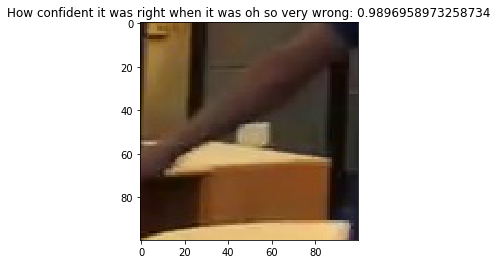

Should be not_drone


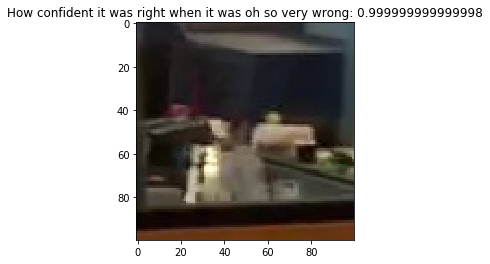

Should be not_drone


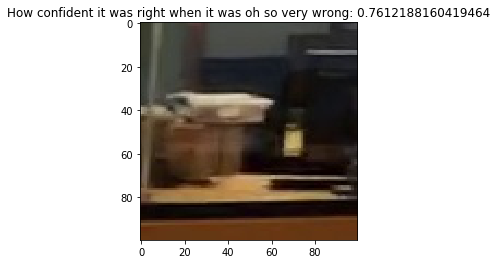

Should be not_drone


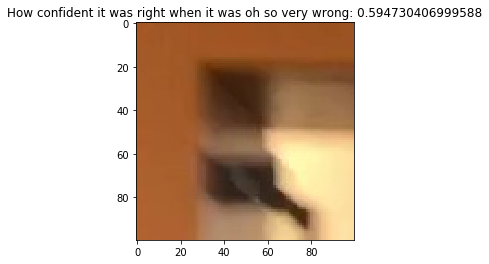

Should be not_drone


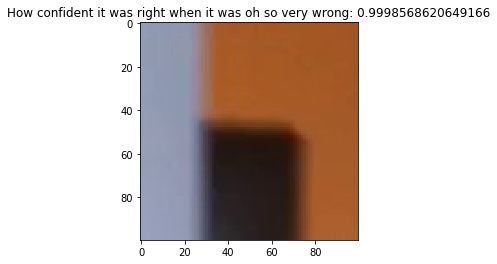

Should be not_drone


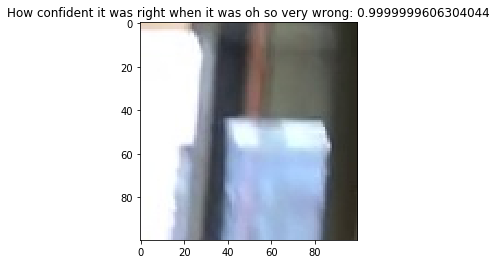

Should be not_drone


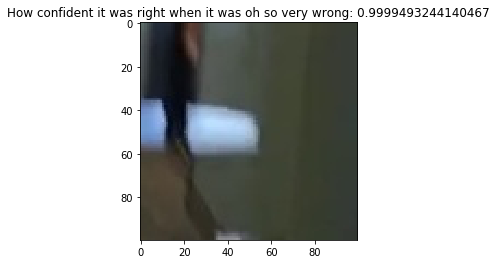

Should be not_drone


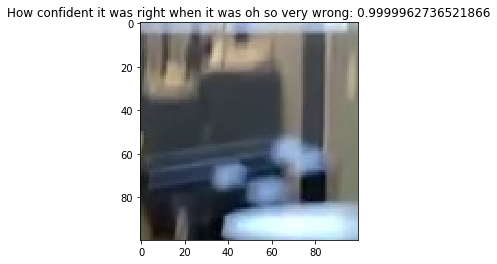

Should be not_drone


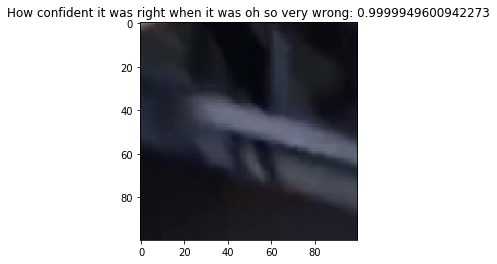

Should be not_drone


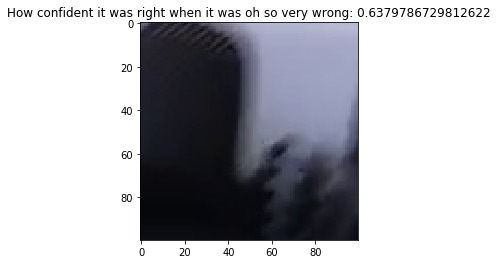

Should be not_drone


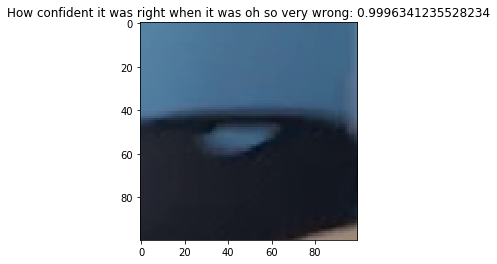

Should be not_drone


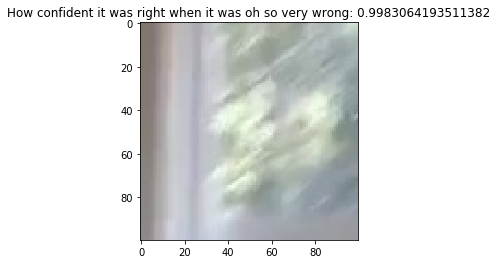

Should be not_drone


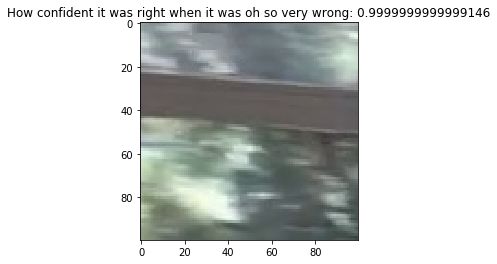

Should be not_drone


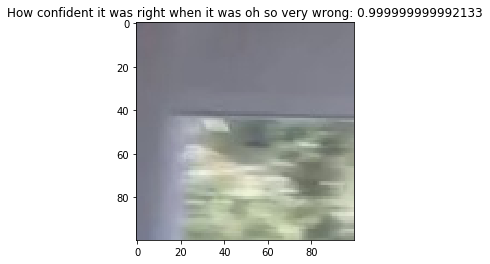

Should be not_drone


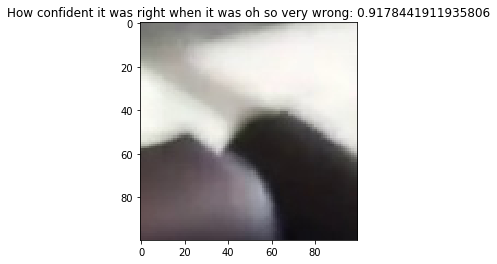

Should be not_drone


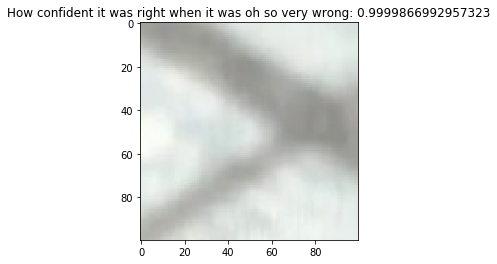

Should be not_drone


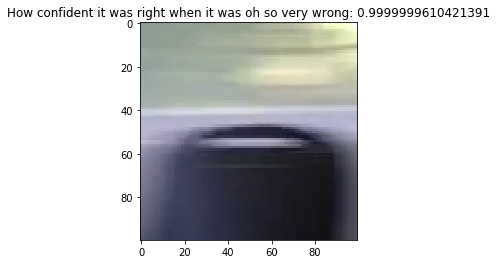

Should be not_drone


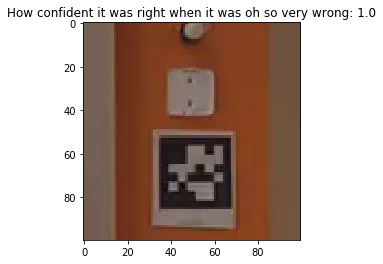

Should be not_drone


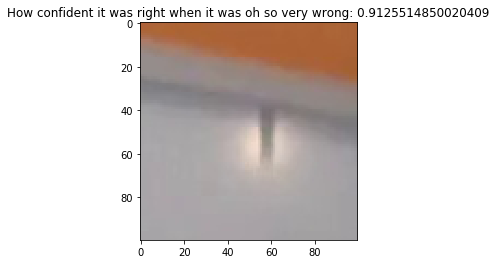

Should be not_drone


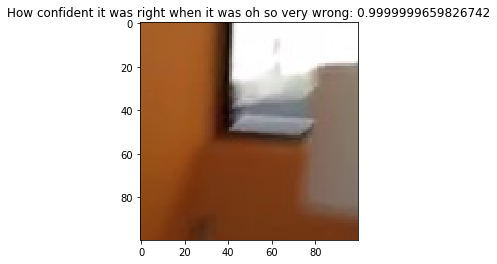

Should be not_drone


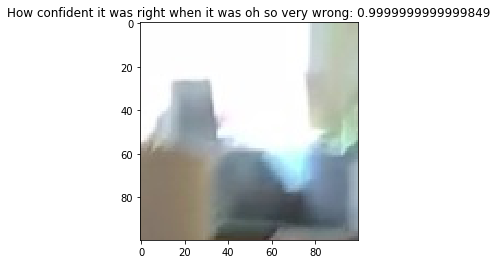

Should be not_drone


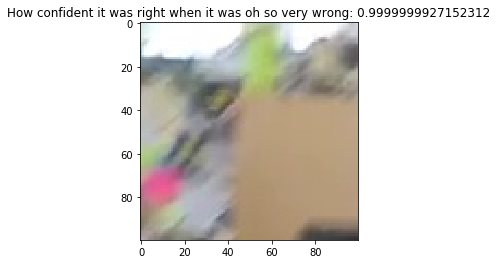

Should be not_drone


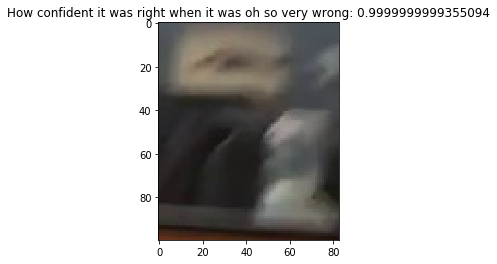

Should be not_drone


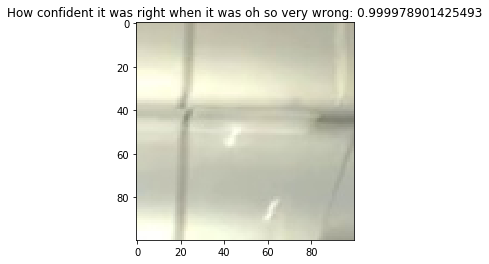

Should be not_drone


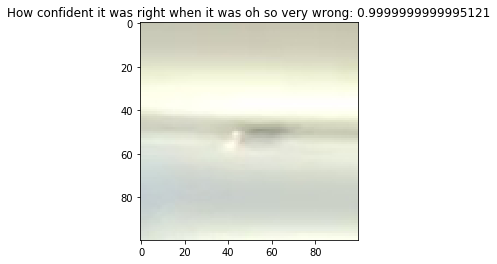

Should be not_drone


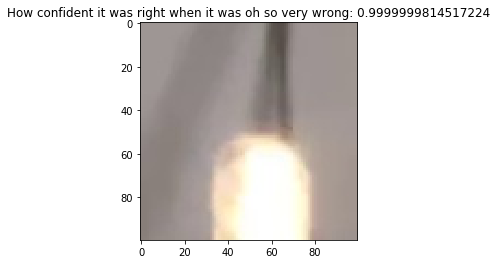

Should be not_drone


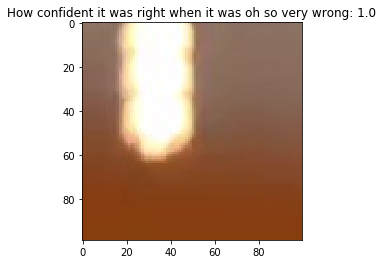

Should be not_drone


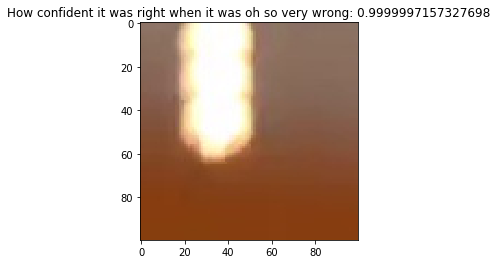

Should be not_drone


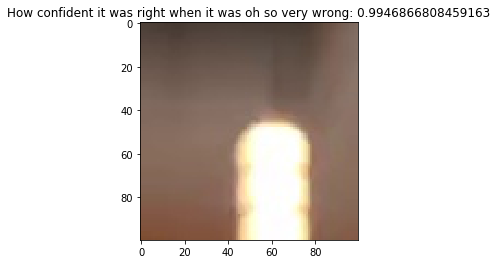

Should be not_drone


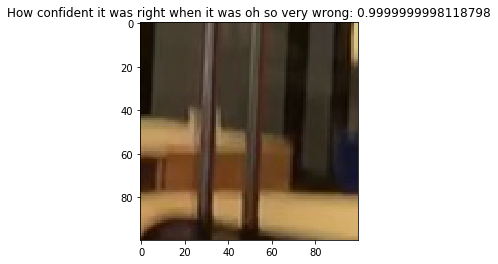

Should be not_drone


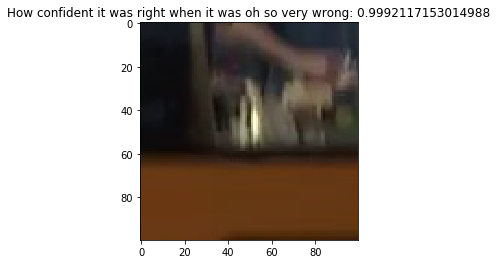

Should be not_drone


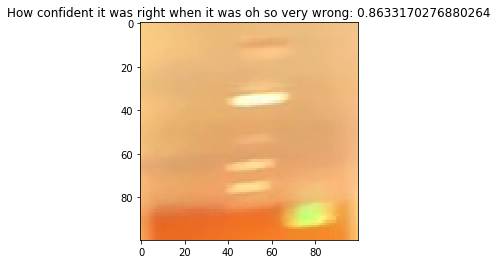

Should be not_drone


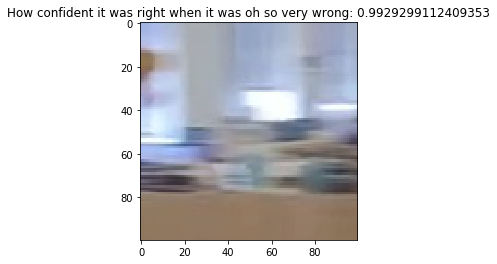

Should be not_drone


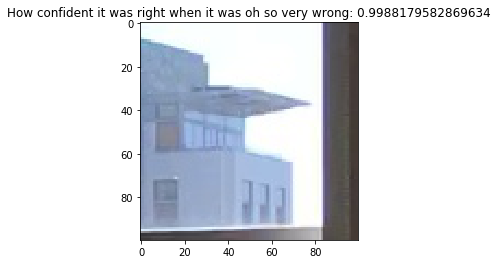

Should be not_drone


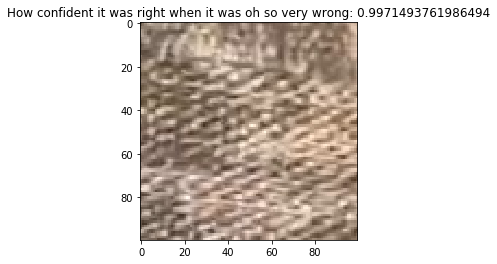

Should be not_drone


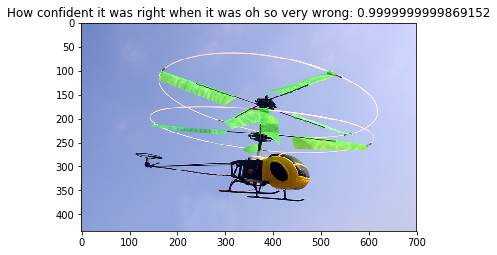

Should be not_drone


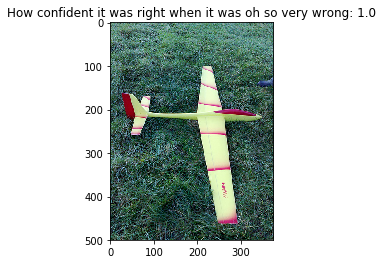

Should be not_drone


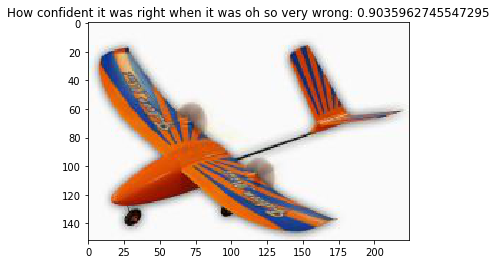

Should be not_drone


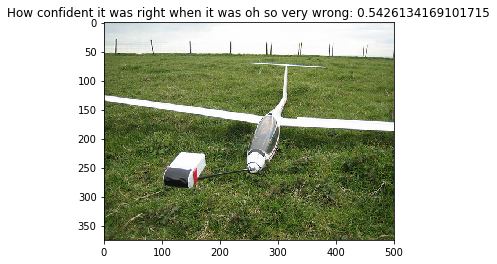

Should be not_drone


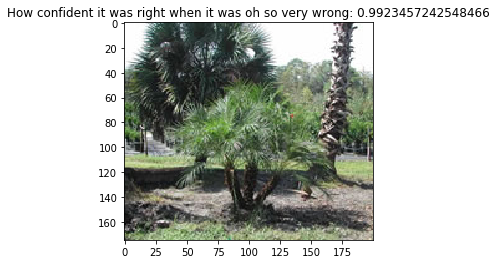

Should be not_drone


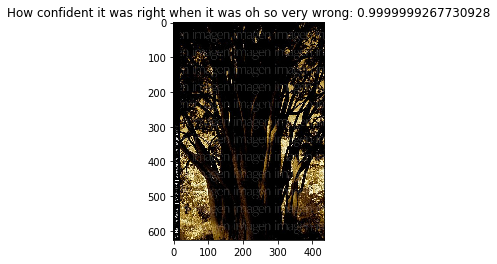

Should be not_drone


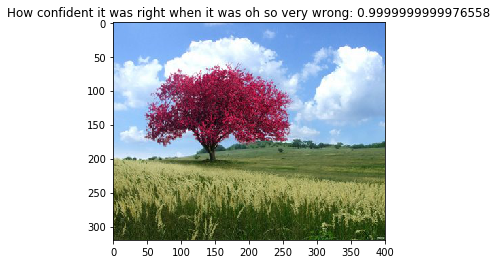

Should be not_drone


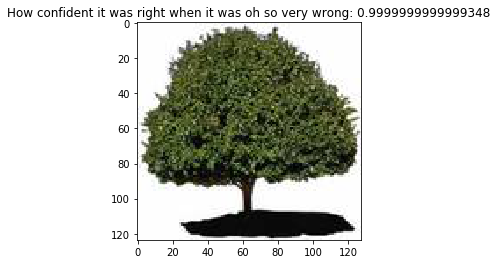

Should be not_drone


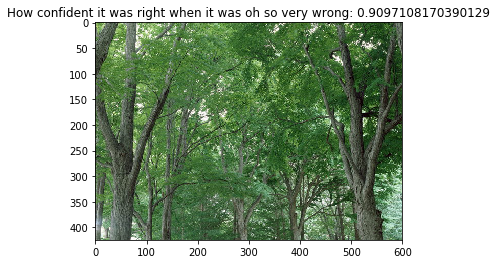

Should be not_drone


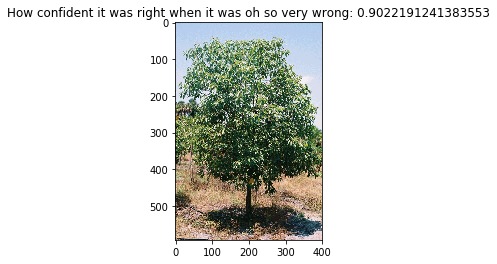

Should be not_drone


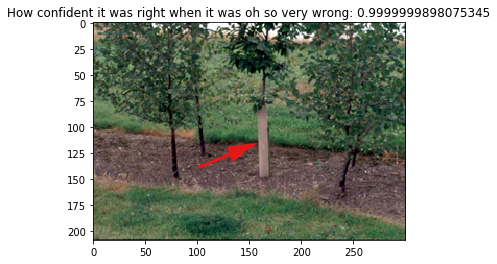

Should be not_drone


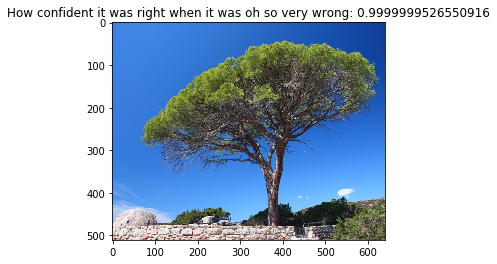

Should be not_drone


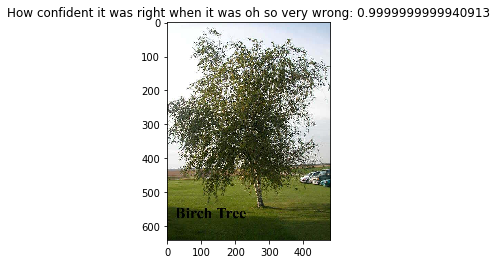

Should be not_drone


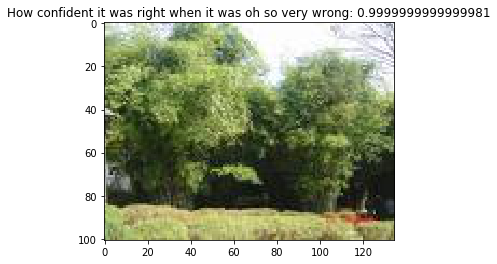

Should be not_drone


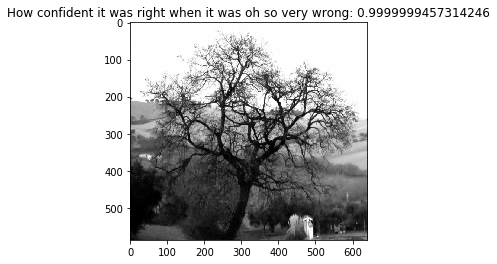

Should be not_drone


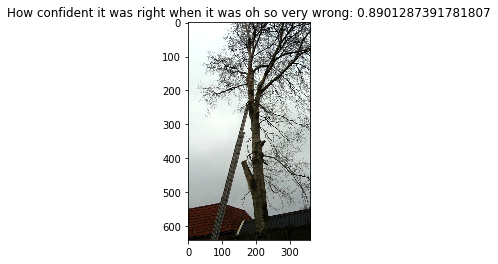

Should be not_drone


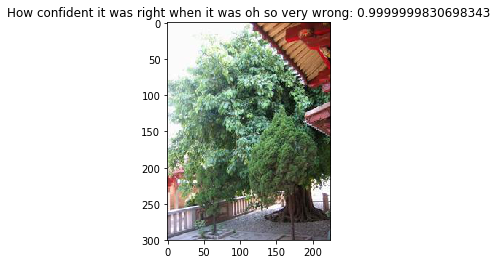

Should be not_drone


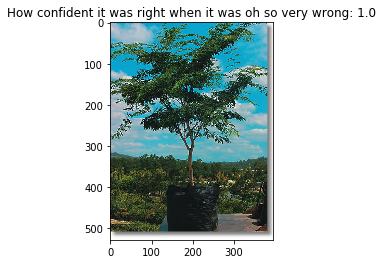

Should be not_drone


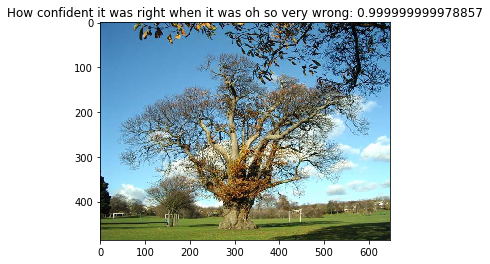

Should be not_drone


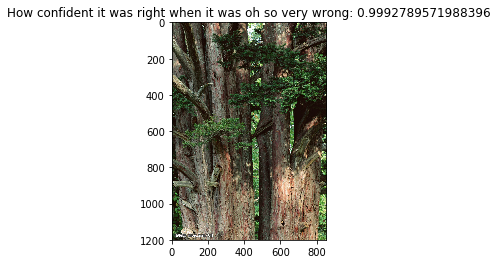

Should be not_drone


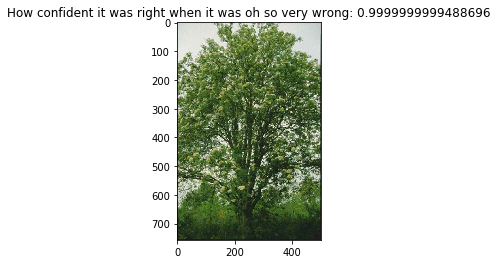

Should be not_drone


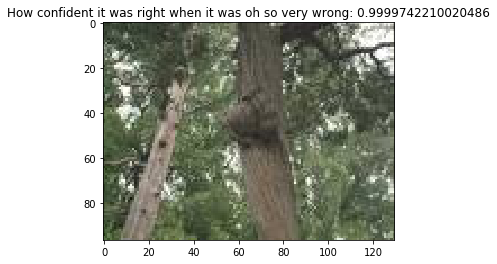

Should be not_drone


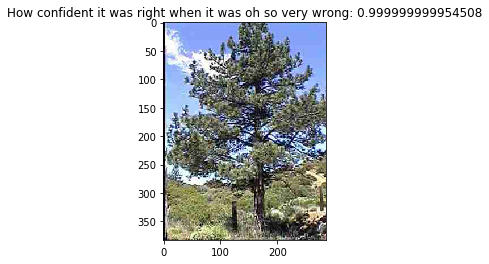

Should be not_drone


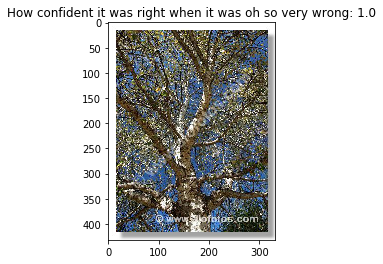

Should be not_drone


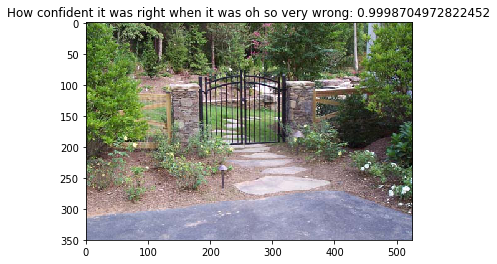

Should be not_drone


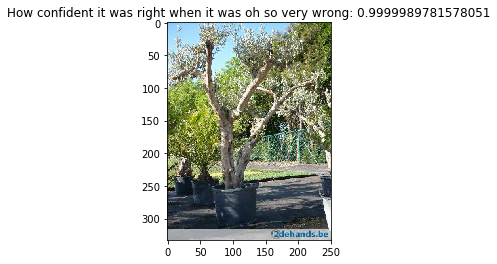

Should be not_drone


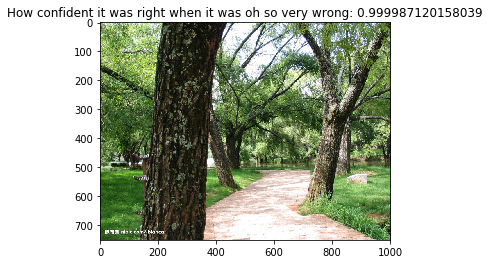

Should be not_drone


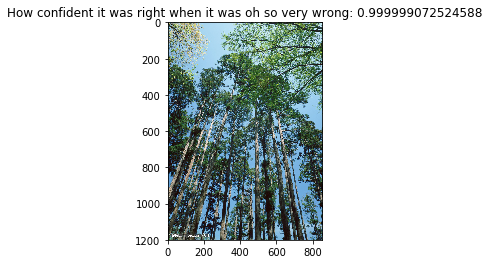

Should be not_drone


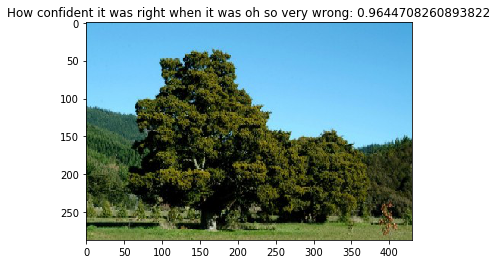

Should be not_drone


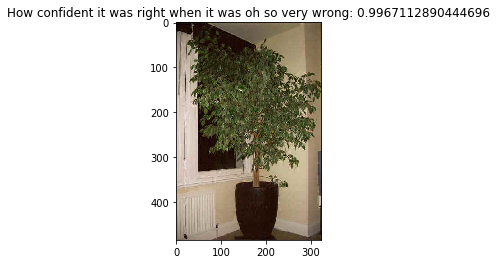

Should be not_drone


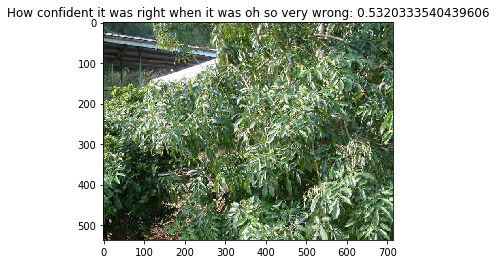

Should be not_drone


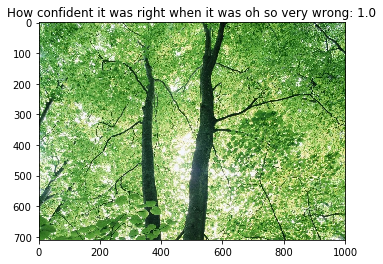

In [75]:
'''Show misclassified'''
for idx, isCorrect in enumerate(accuracy_list):
    if not isCorrect:
        print("Should be", ["drone", "not_drone"][int(y_label[idx])])
        plt.title("How confident it was right when it was oh so very wrong: " + str(1 - confidence_list[idx][0, int(y_label[idx])]))
        plt.imshow(x_data[idx])
        plt.show()

Found 2864 images belonging to 2 classes.


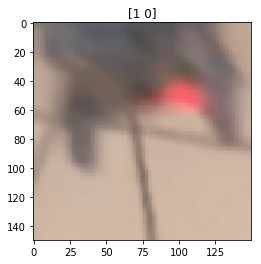

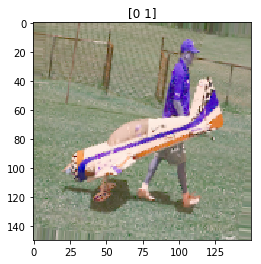

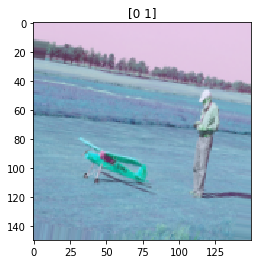

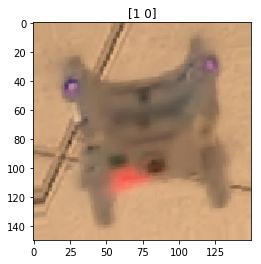

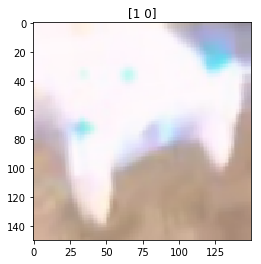

...

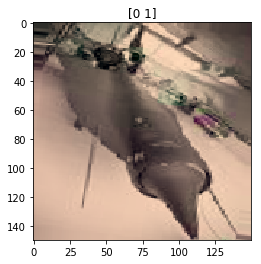

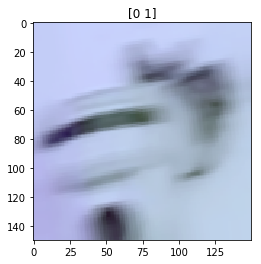

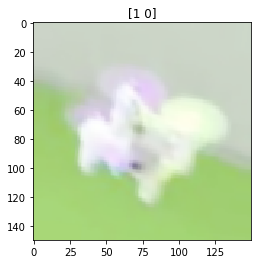

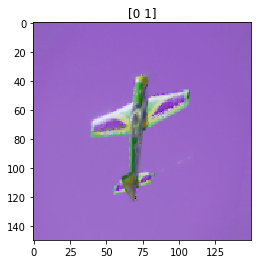

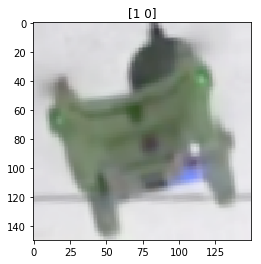

In [40]:
'''Create new ImageDataGenerator to visualize effect of data augmentation'''
train_datagen = ImageDataGenerator(
    rotation_range = 10,
    horizontal_flip=True,
    preprocessing_function = data_augmentation_function
    )

batches = train_datagen.flow_from_directory('real_data/training', target_size=(150,150),
      class_mode='categorical', batch_size=32)

x_batch, y_batch = next(batches)
for i in range (0,32):
    picture = x_batch[i].astype(np.uint8)
    plt.figure()
    plt.title(y_batch[i].astype(int))
    plt.imshow(picture)
    plt.show()

109
1.0
[[1.0000000e+00 2.0594026e-15]]


c:\users\hiro\anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:8: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
  


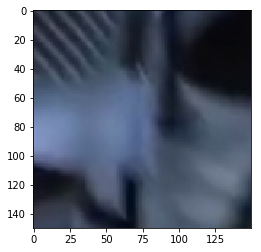

In [159]:
'''Predict'''
if np.random.randint(2):
    num = np.random.randint(len(drone_images))
else:
    num = np.random.randint(len(not_drone_images)) + len(drone_images)
print(num)
print(y_label[num])
picture = sc.misc.imresize(x_data[num],(150,150))

# predict the probability across all output classes
yhat = my_model.predict(np.expand_dims((picture), axis=0))

# from keras.applications.vgg16 import decode_predictions
# # convert the probabilities to class labels
# label = decode_predictions(yhat)
# # retrieve the most likely result, e.g. highest probability
# label = label[0][0]
# # print the classification
# print('%s (%.2f%%)' % (label[1], label[2]*100))

print(yhat)
plt.imshow(picture)
plt.show()